# Final 

## High-Risk Census Tracts: Analyzing Fatal and Severe Collisions in Los Angeles (2015-2019) and their Demographic Overlap

#### Team member: Veronica De Santos Quezada

### Who’s Most at Risk? Social Demographics and Traffic Collisions in the City of Los Angeles

Our research will evaluate different socio-demographic characteristics, such as median household income, race and ethnicity, and age to explore which communities are most susceptible to traffic collisions in the City of Los Angeles. This notebook focuses on analyzing age distribution and its overlap with high-collision census tracts.

#### Data Sources & Geographic Information
- **American Community Survey (ACS) 2015-2029 (5-Year Estimates) on Age**
- **Transportation Injury Mapping System (TIMS) 2015-2019 Fatal and Severe Crashes in the City of Los Angeles**

## Analyze my dataset

In [1]:
# importing pandas for data exploration and data analysis
import pandas as pd

In [2]:
# upload acs data 
df = pd.read_csv('data_midterm/age_dataset.csv')

In [3]:
# view rows and columns coumt 
df.shape

(2346, 25)

## Converting Data Types

In [4]:
# review Geo_FIPS for leading zero
df.Geo_FIPS.head()

0    6037101110
1    6037101122
2    6037101210
3    6037101220
4    6037101300
Name: Geo_FIPS, dtype: int64

In [5]:
# convert Geo_FIPS, state, and county data type from integer to string to include leading zero 
df = pd.read_csv('data_midterm/age_dataset.csv',
     dtype=
                 {'Geo_FIPS': str, 
                  'Geo_STATE': str, 
                  'Geo_COUNTY': str })

In [6]:
# check for leading zero 
df.head(5)

,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_STATE,...,SE_A01001_004,SE_A01001_005,SE_A01001_006,SE_A01001_007,SE_A01001_008,SE_A01001_009,SE_A01001_010,SE_A01001_011,SE_A01001_012,SE_A01001_013
0,06037101110,14000US06037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3871,06,...,200,132,291,652,555,580,604,430,219,78
1,06037101122,14000US06037101122,Census Tract 1011.22,"Census Tract 1011.22, Los Angeles County, Cali...",ca,140,0,ACSSF,3872,06,...,234,12,289,535,211,568,693,417,219,44
2,06037101210,14000US06037101210,Census Tract 1012.10,"Census Tract 1012.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3873,06,...,383,198,651,848,1030,933,781,392,181,51
3,06037101220,14000US06037101220,Census Tract 1012.20,"Census Tract 1012.20, Los Angeles County, Cali...",ca,140,0,ACSSF,3874,06,...,309,142,305,503,513,445,589,306,227,63
4,06037101300,14000US06037101300,Census Tract 1013,"Census Tract 1013, Los Angeles County, California",ca,140,0,ACSSF,3875,06,...,93,43,182,460,363,620,880,442,272,226


In [7]:
# checking state and county
print(df.Geo_STATE.head(2))     
print(df.Geo_COUNTY.head(2))

0    06
1    06
Name: Geo_STATE, dtype: object
0    037
1    037
Name: Geo_COUNTY, dtype: object


In [8]:
# renaming my dataset as age for clarity
age = df

## Cleaning and Reorganizing the data

In [9]:
# find unnecessary columns with zero values 
age.columns[age.isna().all()].tolist()

[]

In [10]:
# seems like the age dataset has no zero values, but I will still delete uncessary columns 
age = age.dropna(axis=1,how="all")

In [11]:
# Create a new dataframe with selected columns
columns_to_keep = [
    'Geo_FIPS',
    'Geo_STATE',
    'Geo_COUNTY',
    'Geo_TRACT',
    'SE_A01001_001',
    'SE_A01001_002',
    'SE_A01001_003',
    'SE_A01001_004',
    'SE_A01001_005',
    'SE_A01001_006',
    'SE_A01001_007',
    'SE_A01001_008',
    'SE_A01001_009',
    'SE_A01001_010',
    'SE_A01001_011',
    'SE_A01001_012',
    'SE_A01001_013'
]

# Select only the specified columns
age = age[columns_to_keep]

In [12]:
# changing ACS column names to category names
column_rename_map = {
    'SE_A01001_001': 'Total Population',
    'SE_A01001_002': 'Under 5 Years',
    'SE_A01001_003': '5 to 9 Years',
    'SE_A01001_004': '10 to 14 Years',
    'SE_A01001_005': '15 to 17 Years',
    'SE_A01001_006': '18 to 24 Years',
    'SE_A01001_007': '25 to 34 Years',
    'SE_A01001_008': '35 to 44 Years',
    'SE_A01001_009': '45 to 54 Years',
    'SE_A01001_010': '55 to 64 Years',
    'SE_A01001_011': '65 to 74 Years',
    'SE_A01001_012': '75 to 84 Years',
    'SE_A01001_013': '85 Years and Over'
}

In [13]:
# Rename the columns in age
age = age.rename(columns=column_rename_map)

In [14]:
# Define new age groupings
age['Children & Adolescents (0-17)'] = age[['Under 5 Years', '5 to 9 Years', '10 to 14 Years', '15 to 17 Years']].sum(axis=1)
age['Young Adults (18-34)'] = age[['18 to 24 Years', '25 to 34 Years']].sum(axis=1)
age['Middle-Aged Adults (35-64)'] = age[['35 to 44 Years', '45 to 54 Years', '55 to 64 Years']].sum(axis=1)
age['Older Adults (65 and Over)'] = age[['65 to 74 Years', '75 to 84 Years', '85 Years and Over']].sum(axis=1)

# Select only relevant columns (keep geographic identifiers and new age groups)
age_grouped_combined = age[['Geo_FIPS', 'Geo_STATE', 'Geo_COUNTY', 'Geo_TRACT', 'Total Population',
                                 'Children & Adolescents (0-17)', 'Young Adults (18-34)',
                                 'Middle-Aged Adults (35-64)', 'Older Adults (65 and Over)']]

In [15]:
# renaming my dataset
age_final = age_grouped_combined

## Merge

###  Merging the City of LA census tracts with LA County census data for our project area

In [16]:
# Importing library
import pandas as pd

In [17]:
# I will use geographical data, importing geopandas
import geopandas as gpd

In [18]:
# Upload my data
cityofla=gpd.read_file('data_midterm/cityLA.zip')

In [19]:
# add a FIPS column
# creating a new column so that I can merge the shapefile and census tracts 

cityofla['Geo_FIPS'] = '06' + '037' + cityofla['TRACTCE']

In [20]:
# checking new column was made 
cityofla.head(2)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Le_1,Shape_Area,geometry,Geo_FIPS
0,G0600370101110,06,037,101110,06037101110,1011.10,Census Tract 1011.10,G5020,S,1142401.0,0.0,+34.2594737,-118.2929869,4585.520052,4585.520052,1.142400e+06,"POLYGON ((-2019033.589 -124429.155, -2018948.5...",06037101110
1,G0600370101122,06,037,101122,06037101122,1011.22,Census Tract 1011.22,G5020,S,2644045.0,0.0,+34.2677213,-118.2901465,9652.233049,9652.233049,2.644046e+06,"POLYGON ((-2017297.948 -125225.326, -2017305.0...",06037101122


In [21]:
# need to merge by creating a new dataframe
la_age =cityofla.merge(age_final,on="Geo_FIPS")

## Function and Loop for Age Distribution in the City of Los Angeles

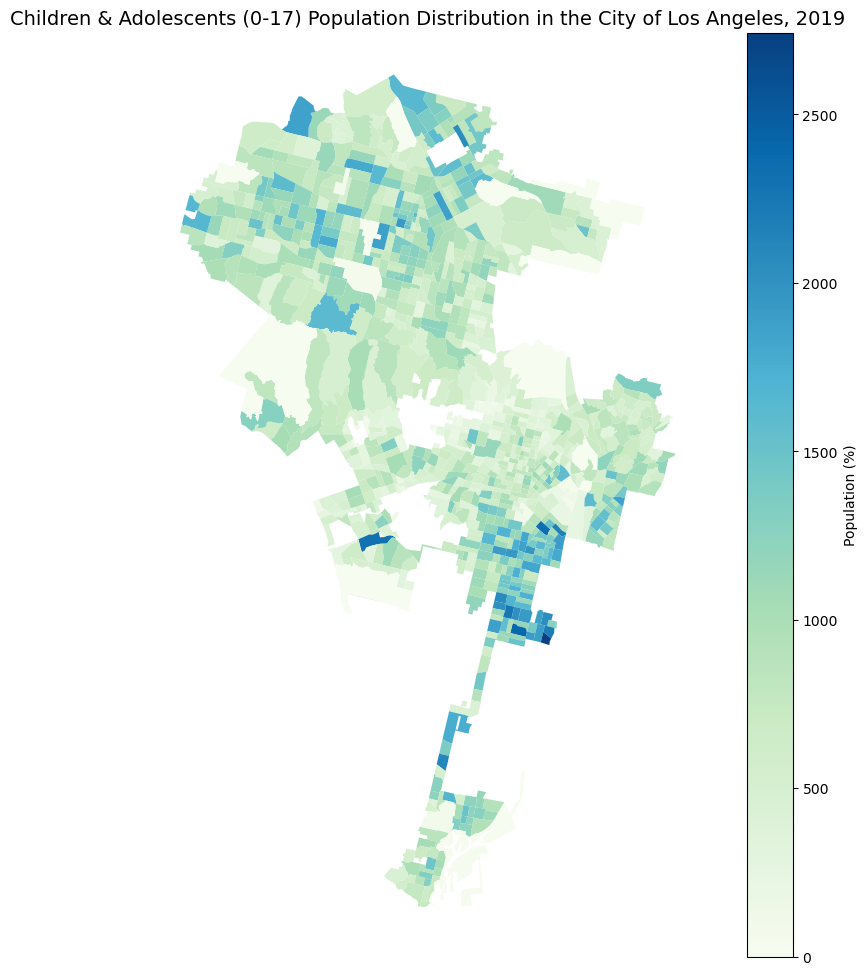

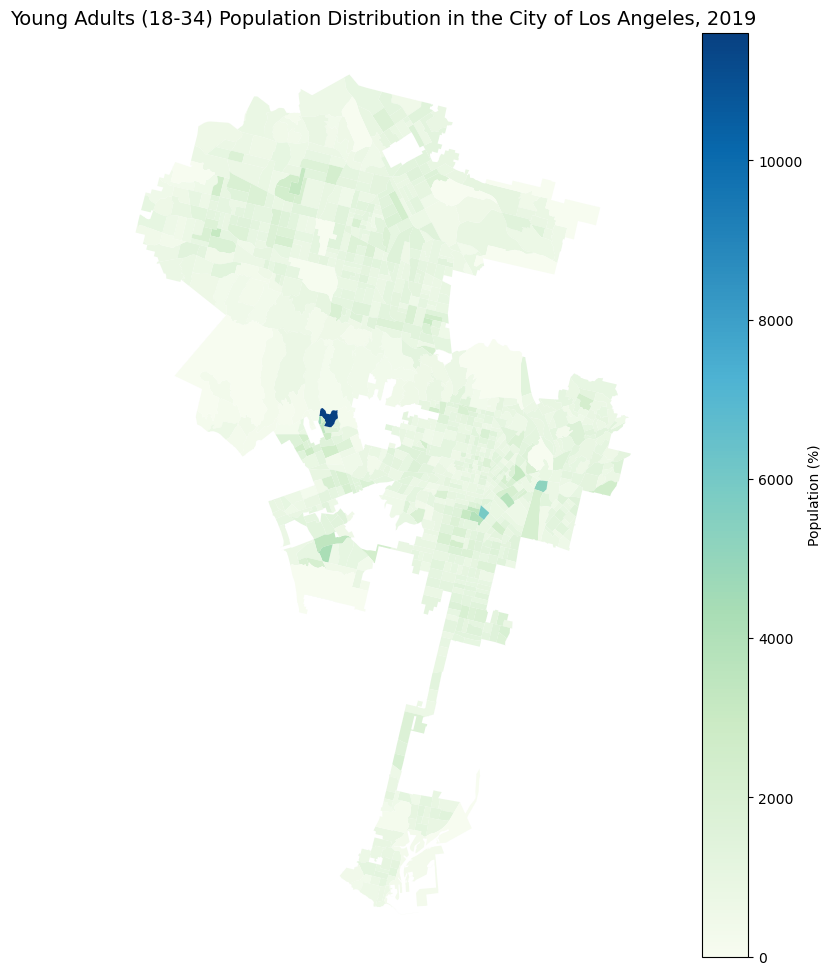

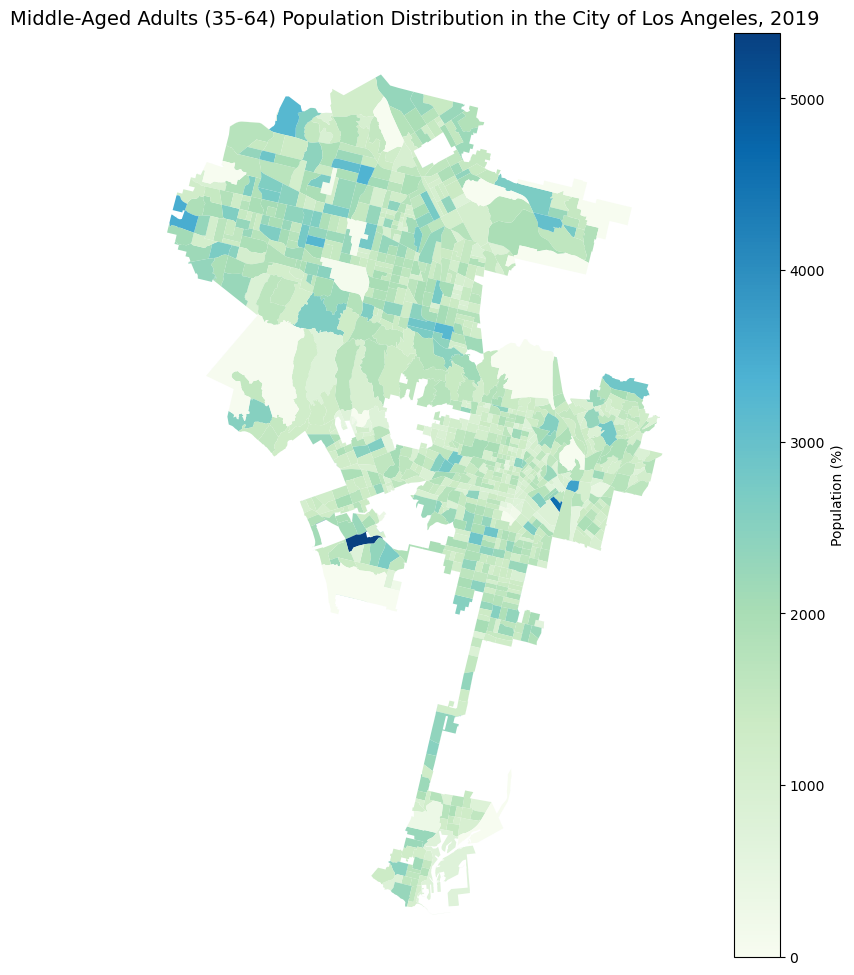

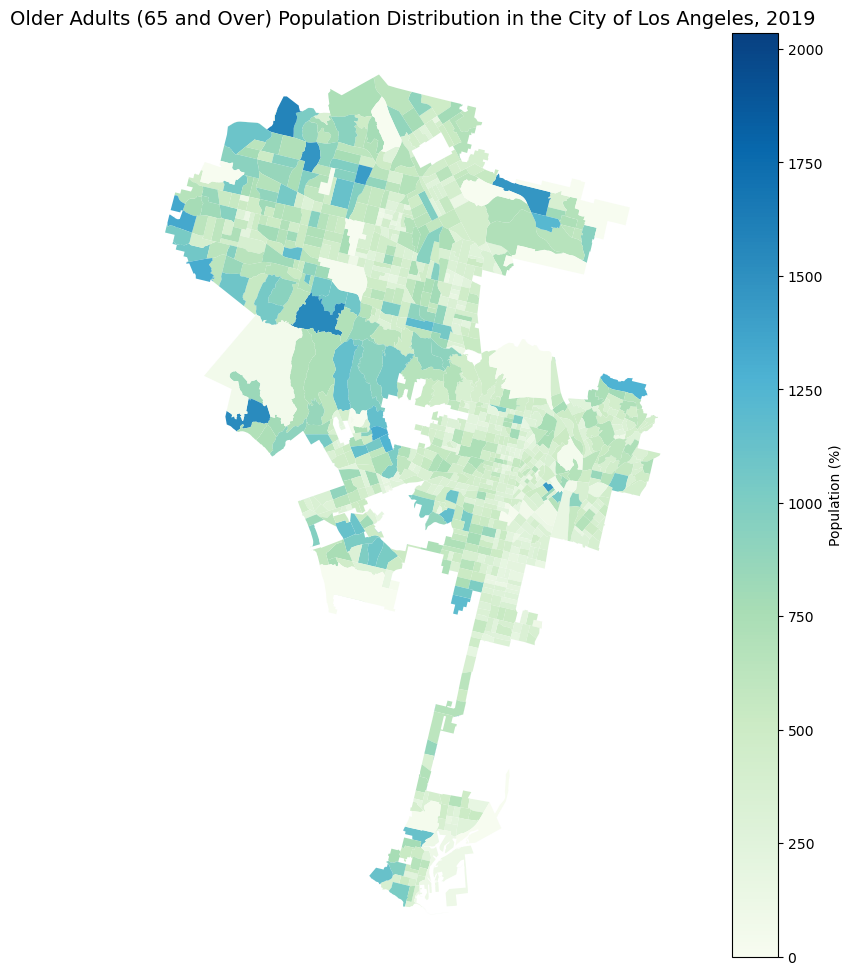

In [22]:
import matplotlib.pyplot as plt

# Function to generate age distribution maps
def plot_age_maps(data, columns, title_prefix):  
    
    for column in columns:
        fig, ax = plt.subplots(1, 1, figsize=(12, 12))
        
        # Plot census tracts with the selected age group percentage
        la_age.plot(ax=ax, column=column, legend=True, cmap='GnBu',
                    legend_kwds={"label": "Population (%)", "orientation": "vertical"})
        
        ax.axis('off')
        ax.set_title(f"{column} {title_prefix} in the City of Los Angeles, 2019", fontsize=14)

# Use the age categories
age_map = [
    'Children & Adolescents (0-17)',
    'Young Adults (18-34)',
    'Middle-Aged Adults (35-64)',
    'Older Adults (65 and Over)'
]

# Loop!
plot_age_maps(la_age, age_map, "Population Distribution")


## Charts for Age Distribution in the City of Los Angeles

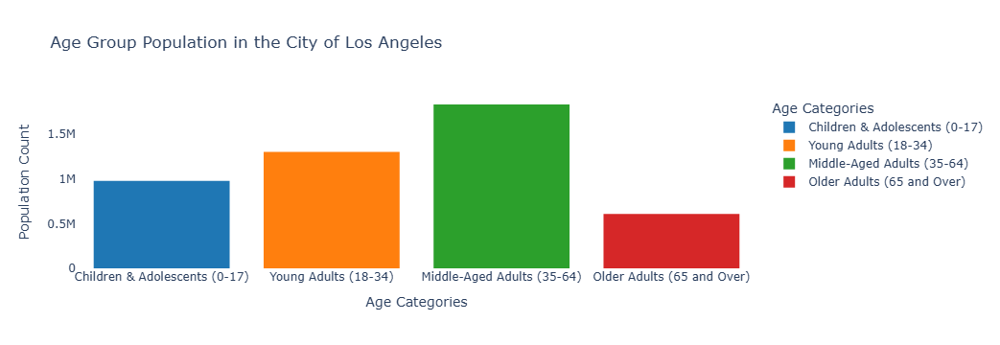

In [23]:
# Create a DataFrame for the age group data
age_bar = pd.DataFrame({
    'Age Group': ['Children & Adolescents (0-17)', 'Young Adults (18-34)', 
                  'Middle-Aged Adults (35-64)', 'Older Adults (65 and Over)'],
    'Population': [978971, 1301147, 1833051, 607531]
})

# Plot the bar chart
import plotly.express as px
fig = px.bar(age_bar, 
             x='Age Group', 
             y='Population', 
             title='Age Group Population in the City of Los Angeles',
             labels={'Population': 'Population Count', 'Age Group': 'Age Categories'},
             color='Age Group',
             color_discrete_map={
                 'Children & Adolescents (0-17)': '#1f77b4',  # Blue
                 'Young Adults (18-34)': '#ff7f0e',  # Orange
                 'Middle-Aged Adults (35-64)': '#2ca02c',  # Green
                 'Older Adults (65 and Over)': '#d62728'  # Red
             }) 

# Set the background to transparent
fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)',  # Transparent background
    paper_bgcolor='rgba(0,0,0,0)'  # Transparent outer background
)

fig.update_traces(marker_line_width=0, textposition='outside')

fig.show()

## Examining Transportation Injury Mapping System
### 2015-2019 Fatal and Severe Crashes in Los Angeles

In [30]:
import pandas as pd
import geopandas as gpd

# Upload TIMS dataset
tims_file_path = "data_midterm/tims_crashes.csv"  
tims_df = pd.read_csv(tims_file_path, low_memory=False)  # Prevents dtype warnings

# Convert TIMS DataFrame into a GeoDataFrame using POINT_X and POINT_Y
tims_gdf = gpd.GeoDataFrame(tims_df, 
                            geometry=gpd.points_from_xy(tims_df.POINT_X, tims_df.POINT_Y),
                            crs="EPSG:4326")  # Match CRS with la_age

# Remove rows with missing coordinates
tims_gdf = tims_gdf.dropna(subset=['geometry'])

# Check structure
print(tims_gdf.crs)
tims_gdf.head()


EPSG:4326


,CASE_ID,ACCIDENT_YEAR,PROC_DATE,JURIS,COLLISION_DATE,COLLISION_TIME,OFFICER_ID,REPORTING_DISTRICT,DAY_OF_WEEK,CHP_SHIFT,...,COUNT_MC_INJURED,PRIMARY_RAMP,SECONDARY_RAMP,LATITUDE,LONGITUDE,COUNTY,CITY,POINT_X,POINT_Y,geometry
0,6292153,2015,2017-04-21,9590,2015-02-15,930,20436,NaN,7,1,...,0,-,-,34.02729,-118.21038,LOS ANGELES,LOS ANGELES,-118.216215,34.029824,POINT (-118.21622 34.02982)
1,6292272,2015,2017-04-14,9565,2015-01-23,5,20209,NaN,5,3,...,0,-,-,33.98707,-118.39974,LOS ANGELES,LOS ANGELES,-118.395973,33.983551,POINT (-118.39597 33.98355)
2,6292319,2015,2017-04-25,9590,2015-02-23,434,20617,NaN,1,3,...,0,-,-,34.03387,-118.22002,LOS ANGELES,LOS ANGELES,-118.220705,34.034132,POINT (-118.2207 34.03413)
3,6292390,2015,2016-04-27,9590,2015-03-28,225,20753,NaN,6,3,...,0,-,-,34.03686,-118.29422,LOS ANGELES,LOS ANGELES,-118.292476,34.036850,POINT (-118.29248 34.03685)
4,6292415,2015,2017-05-09,1942,2015-05-01,2040,25495,0774,5,5,...,0,-,-,NaN,NaN,LOS ANGELES,LOS ANGELES,-118.348620,34.040610,POINT (-118.34862 34.04061)


## Playing around with how to display the map, here I tried to distinguised the fatal and severe crashes

In [37]:
# Filter TIMS crashes correctly using the proper column name
fatal_crashes = tims_gdf[tims_gdf["COLLISION_SEVERITY"] == 1]
severe_crashes = tims_gdf[tims_gdf["COLLISION_SEVERITY"] == 2]

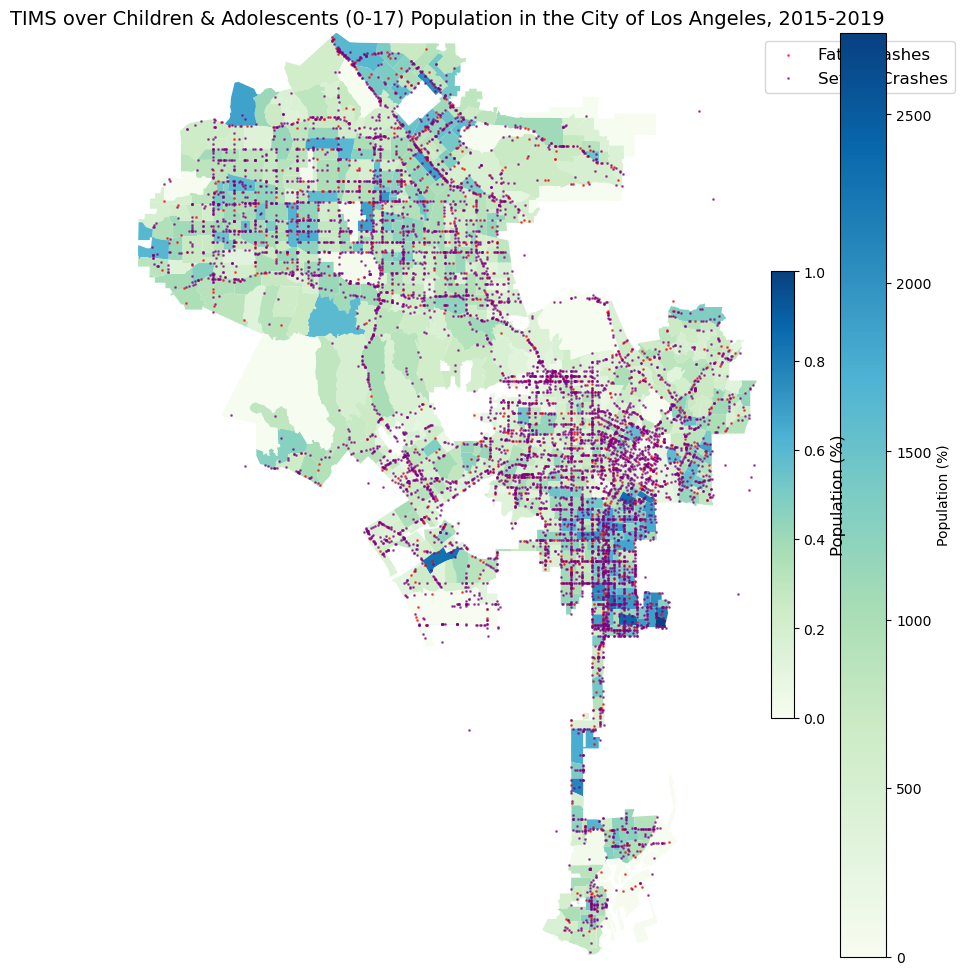

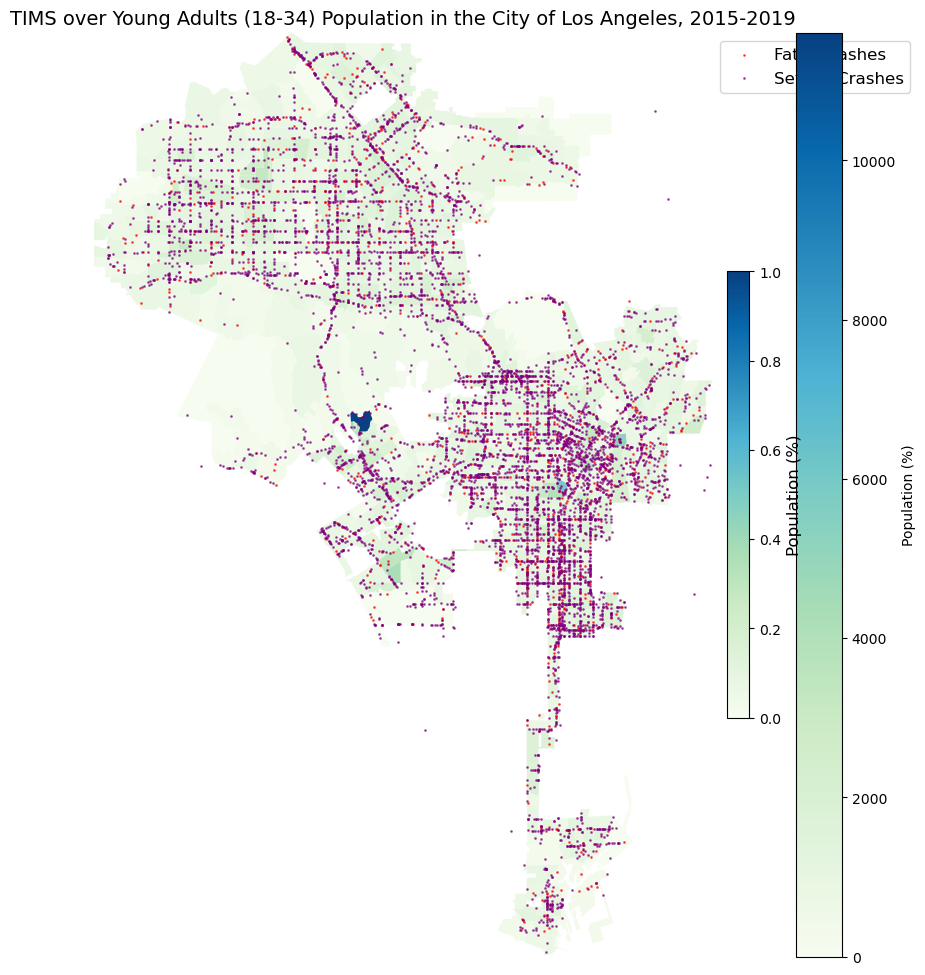

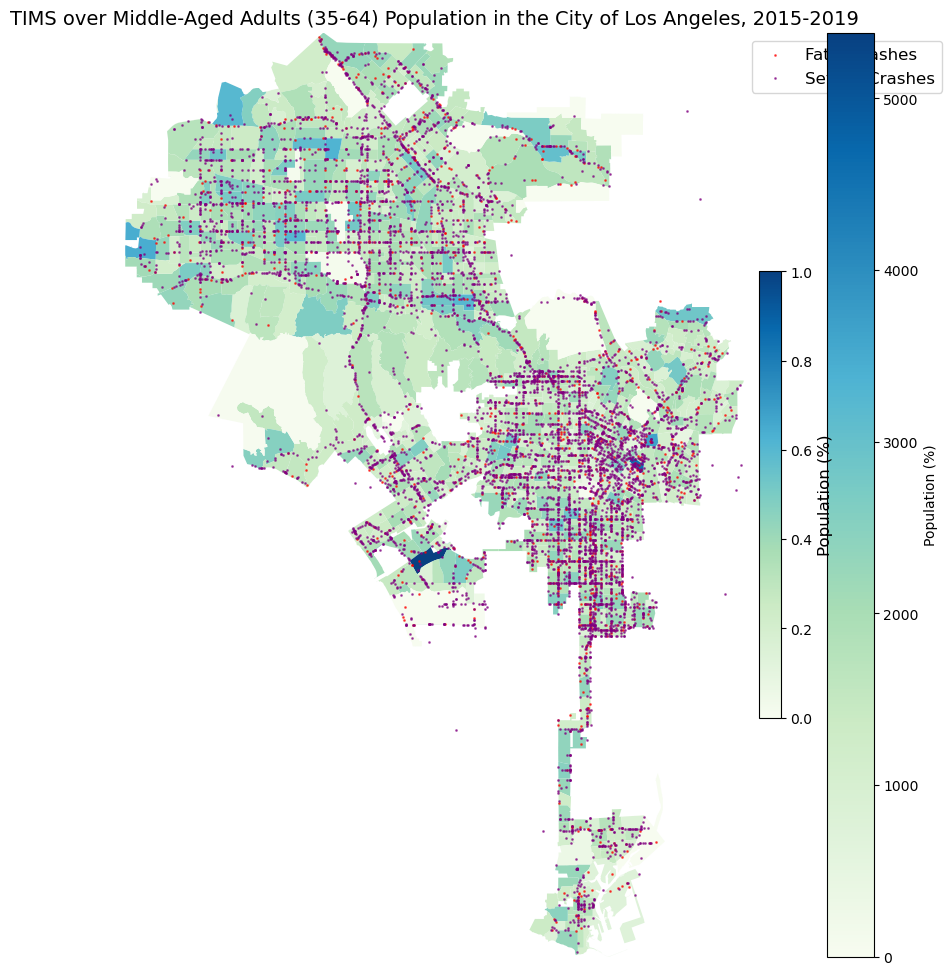

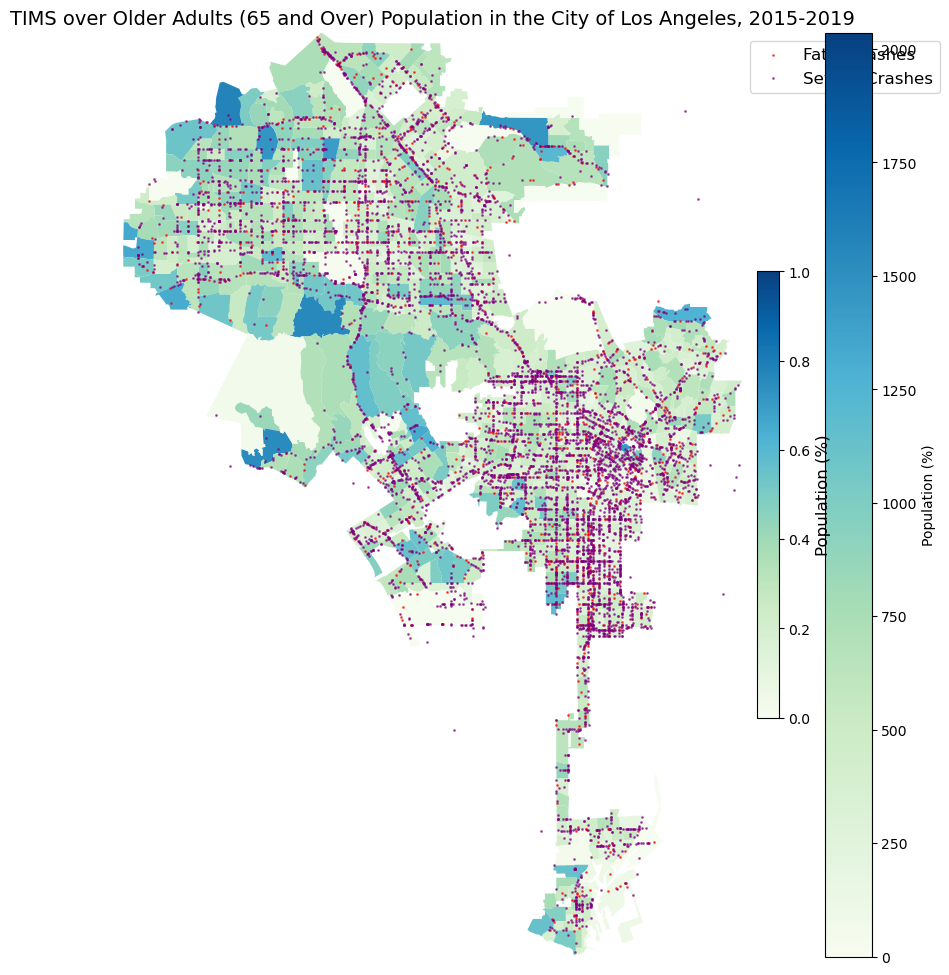

In [45]:
import matplotlib.pyplot as plt

# Function to generate age distribution maps with TIMS overlay (fatal in red, severe in purple)
def plot_age_maps_with_TIMS(data, columns, title_prefix, tims_data, save_path="tims_map.png"):  
    """
    Generates choropleth maps for age groups and overlays TIMS severe/fatal crashes.
    - Fatal crashes (COLLISION_SEVERITY == 1) → Red dots
    - Severe crashes (COLLISION_SEVERITY == 2) → Purple dots
    """
    # Filter TIMS dataset based on COLLISION_SEVERITY
    fatal_crashes = tims_data[tims_data["COLLISION_SEVERITY"] == 1]
    severe_crashes = tims_data[tims_data["COLLISION_SEVERITY"] == 2]

    for column in columns:
        fig, ax = plt.subplots(1, 1, figsize=(12, 12))

        # Plot census tracts with age distribution
        data.plot(ax=ax, column=column, legend=True, cmap='GnBu',
                  legend_kwds={"label": "Population (%)", "orientation": "vertical"})

        # Overlay fatal crashes (red dots)
        fatal_crashes.plot(ax=ax, color='red', markersize=1, alpha=0.6, label="Fatal Crashes")

        # Overlay severe crashes (purple dots)
        severe_crashes.plot(ax=ax, color='purple', markersize=1, alpha=0.6, label="Severe Crashes")

        ax.set_xlim(la_age.total_bounds[[0, 2]])  
        ax.set_ylim(la_age.total_bounds[[1, 3]])  

        # Adjust legend size and position
        ax.legend(fontsize=12, loc="upper left", bbox_to_anchor=(1, 1))  

        # Adjust color bar position
        sm = plt.cm.ScalarMappable(cmap='GnBu')
        sm.set_array([])
        cbar = fig.colorbar(sm, ax=ax, orientation="vertical", fraction=0.03, pad=0.02)
        cbar.set_label("Population (%)", fontsize=12)

        ax.axis('off')
        ax.set_title(f"{title_prefix} {column} Population in the City of Los Angeles, 2015-2019", fontsize=14)

# Run function to generate and save maps with TIMS crashes overlaid in two colors
plot_age_maps_with_TIMS(la_age, age_map, "TIMS over", tims_gdf, save_path="TIMS_Age_Distribution_Map")


## I don't like it, I will keep the fatal and severe crashes together.

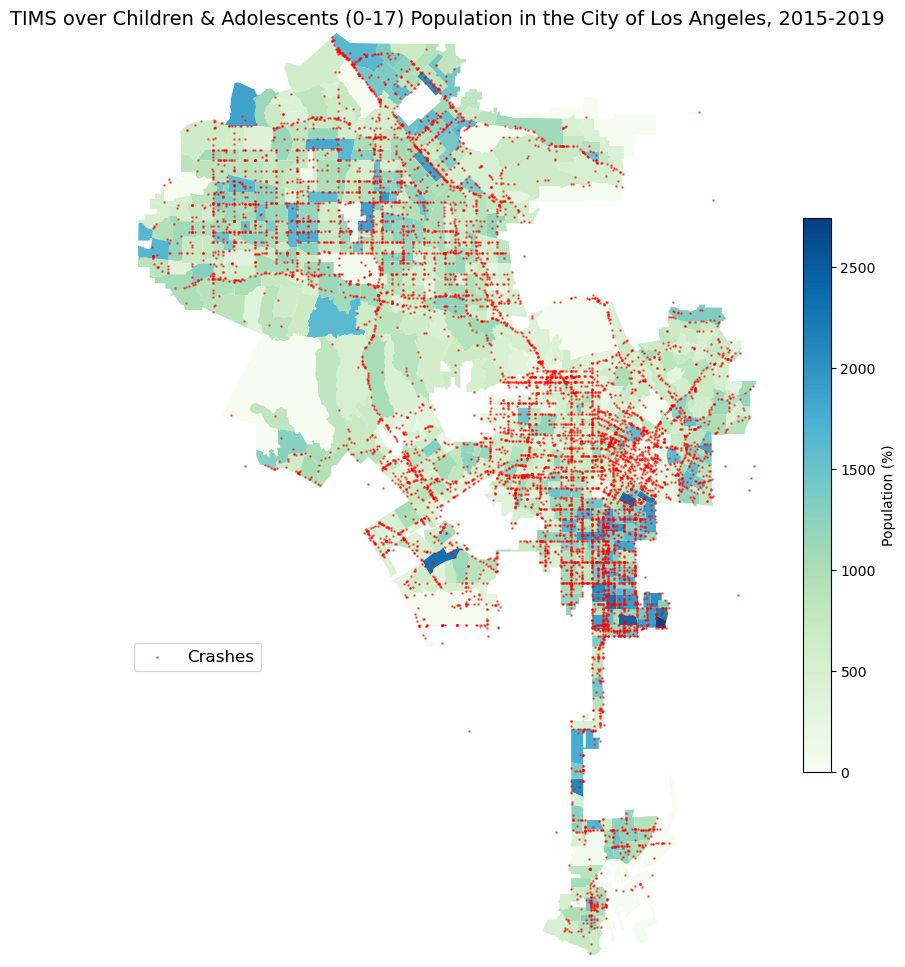

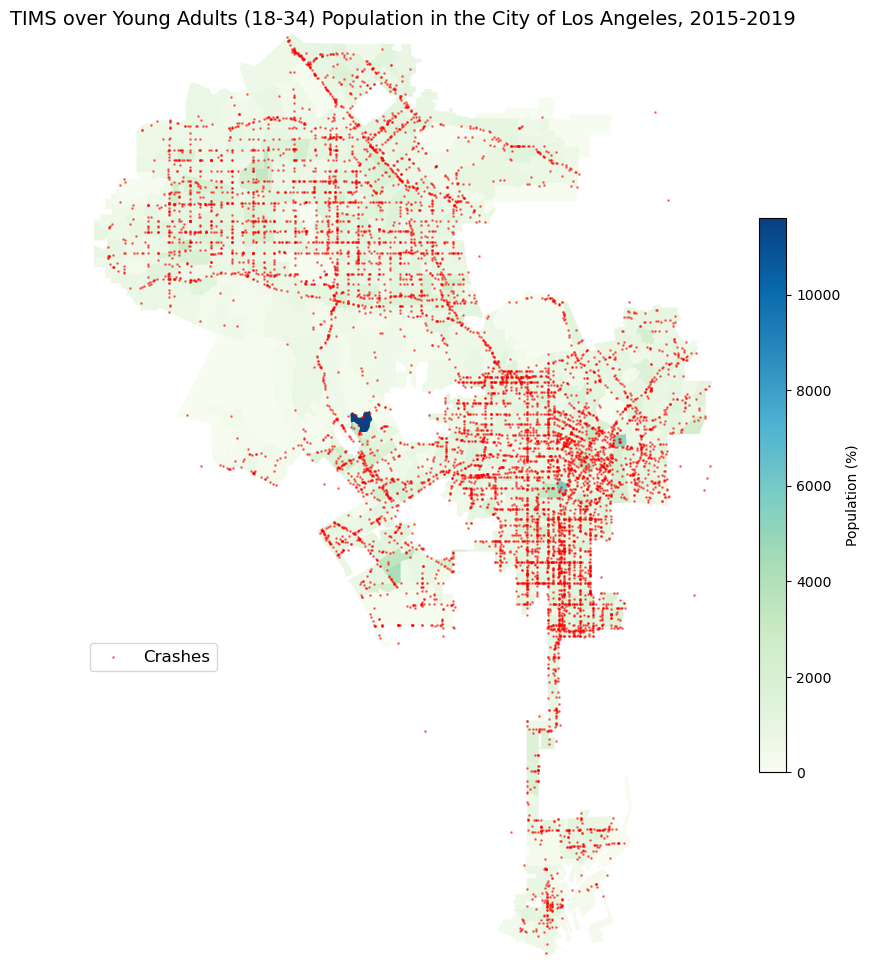

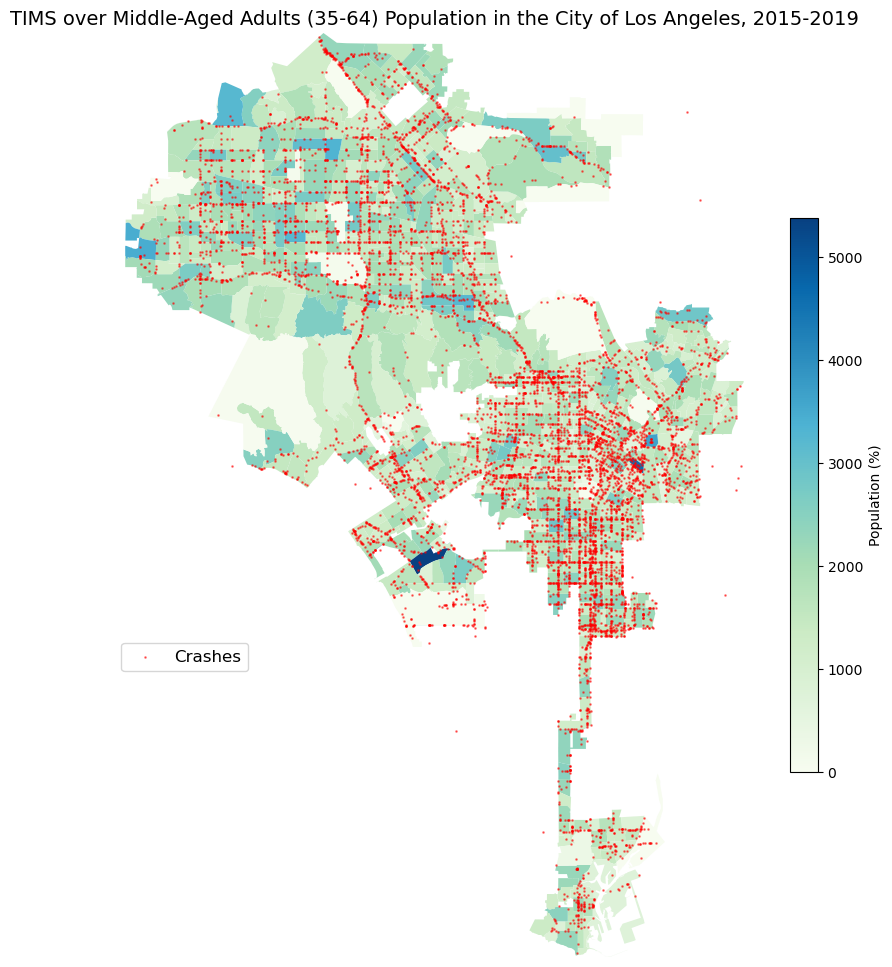

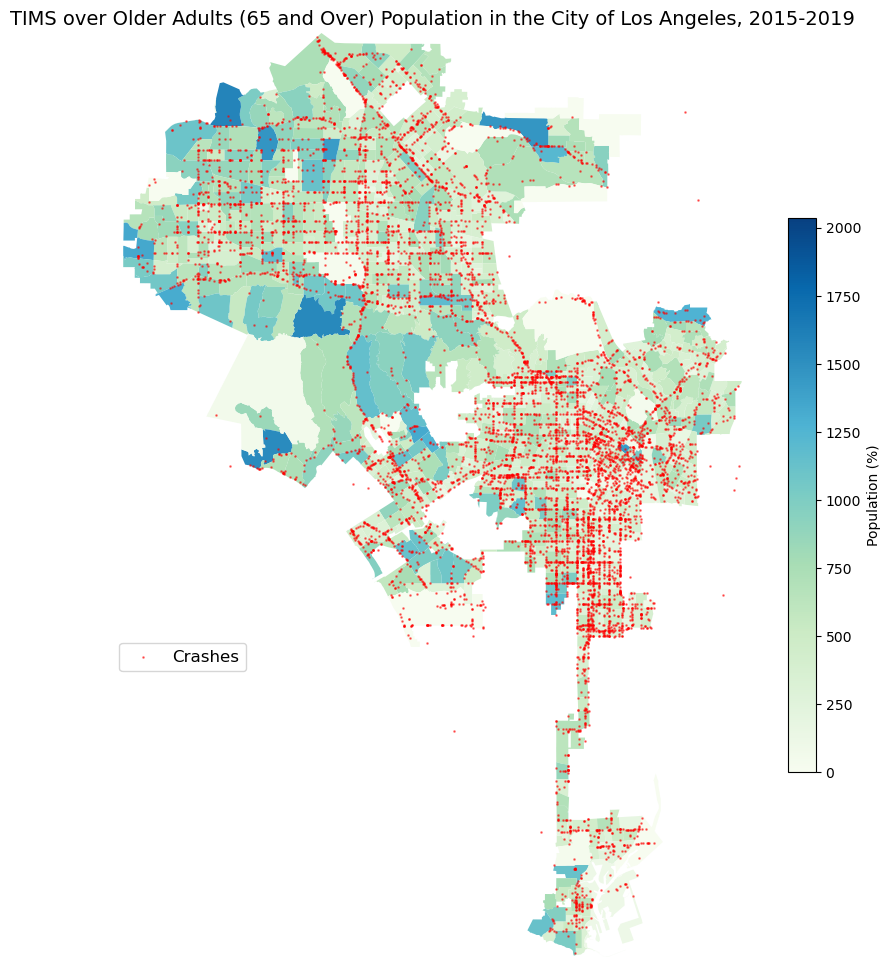

In [54]:
import matplotlib.pyplot as plt

# Generate age distribution maps with TIMS overlay
def plot_age_maps_with_TIMS(data, columns, title_prefix, tims_data, save_path="tims_map.png"):  

    for column in columns:
        fig, ax = plt.subplots(1, 1, figsize=(12, 12))

        # Plot census tracts with age distribution
        data.plot(ax=ax, column=column, legend=True, cmap='GnBu',
                  legend_kwds={"label": "Population (%)", "orientation": "vertical", "shrink": 0.6})

        # Overlay all severe + fatal crashes in red
        tims_data.plot(ax=ax, color='red', markersize=0.8, alpha=0.5, label="Crashes")

        ax.set_xlim(la_age.total_bounds[[0, 2]])  
        ax.set_ylim(la_age.total_bounds[[1, 3]])  

        ax.legend(fontsize=12, loc="lower left", bbox_to_anchor=(-0.02, 0.3))  

        ax.axis('off')
        ax.set_title(f"{title_prefix} {column} Population in the City of Los Angeles, 2015-2019", fontsize=14)

# Run function to generate and save maps with the adjusted legend placement
plot_age_maps_with_TIMS(la_age, age_map, "TIMS over", tims_gdf, save_path="TIMS_Age_Distribution_Map")




# TOP 15 CENSUS TRACTS PER 1000 PEOPLE

In [66]:
# importing census tracts
la_tracts = gpd.read_file('data_midterm/cityLA.zip')

In [78]:
# our zip file does not include total population needed for future analysis 
# upload acs race 2015-2019 data 
race = pd.read_csv('data_midterm/race15_19.csv')

In [79]:
#converting FIPS, STATE, and COUNTY from integer to string & reintegrate leading zero
race = pd.read_csv(
    'data_midterm/race15_19.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    }
)

In [80]:
# going into the column to review state and county 
print(race.Geo_STATE.head(2))
print(race.Geo_COUNTY.head(2))

0    06
1    06
Name: Geo_STATE, dtype: object
0    037
1    037
Name: Geo_COUNTY, dtype: object


In [81]:
# keep columns 
# only keep B04001_001 - Total Population 
columns_to_keep = ['Geo_FIPS', 
                   'Geo_STATE', 
                   'Geo_COUNTY',
                   'Geo_TRACT',
                   'SE_B04001_001']

race = race [columns_to_keep]     

In [82]:
#rename columns 
race.columns = ['FIPS',
                'State',
                'County',
                'Census Tract',
                'Total Population']

In [86]:
# creating new FIPS column to prepare census tracts dataframe for mergining
la_tracts['FIPS'] = '06' + '037' + la_tracts['TRACTCE']

In [88]:
# merging census tracts and total population 
la_city = la_tracts.merge(race, on="FIPS")

In [89]:
#checking that data merged
la_city.head(2)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,INTPTLON,Shape_Leng,Shape_Le_1,Shape_Area,geometry,FIPS,State,County,Census Tract,Total Population
0,G0600370101110,06,037,101110,06037101110,1011.10,Census Tract 1011.10,G5020,S,1142401.0,...,-118.2929869,4585.520052,4585.520052,1.142400e+06,"POLYGON ((-2019033.589 -124429.155, -2018948.5...",06037101110,06,037,101110,4283
1,G0600370101122,06,037,101122,06037101122,1011.22,Census Tract 1011.22,G5020,S,2644045.0,...,-118.2901465,9652.233049,9652.233049,2.644046e+06,"POLYGON ((-2017297.948 -125225.326, -2017305.0...",06037101122,06,037,101122,3405


In [90]:
#cleaning the data to only include necessary columns 
columns_to_keep_la = ['FIPS', 
                   'Total Population', 
                   'geometry']

la_city = la_city[columns_to_keep_la]

In [91]:
# identifying total population row to delete; there is no total population column 
la_city.tail()

,FIPS,Total Population,geometry
1163,06037980026,26,"POLYGON ((-2017734.652 -121289.969, -2017604.1..."
1164,06037980028,0,"POLYGON ((-2037371.498 -155528.944, -2037368.6..."
1165,06037980030,0,"POLYGON ((-2039470.503 -159401.276, -2039585.4..."
1166,06037980031,1175,"MULTIPOLYGON (((-2027306.945 -179844.798, -202..."
1167,06037980033,16,"MULTIPOLYGON (((-2027800.331 -180973.621, -202..."


In [92]:
# modifuing total population to numerical values to fix sorting issue (the column was not sorting)
la_city['Total Population'] = pd.to_numeric(la_city['Total Population'], errors='coerce')
la_city.sort_values(by='Total Population', ascending=True).head(20)

,FIPS,Total Population,geometry
1165,06037980030,0,"POLYGON ((-2039470.503 -159401.276, -2039585.4..."
1164,06037980028,0,"POLYGON ((-2037371.498 -155528.944, -2037368.6..."
1008,06037320000,0,"MULTIPOLYGON (((-2026987.276 -137679.181, -202..."
1149,06037980002,0,"MULTIPOLYGON (((-2025190.604 -177036.987, -202..."
1158,06037980020,0,"POLYGON ((-2019136.183 -127669.077, -2019102.7..."
1160,06037980022,0,"POLYGON ((-2034697.534 -114703.299, -2034687.1..."
1161,06037980023,0,"POLYGON ((-2047272.84 -120824.771, -2047312.73..."
1154,06037980013,0,"MULTIPOLYGON (((-2034925.473 -159035.208, -203..."
1150,06037980005,0,"POLYGON ((-2030557.304 -168200.728, -2030641.3..."
1148,06037980001,0,"MULTIPOLYGON (((-2026441.139 -130545.925, -202..."


In [93]:
# deleting entries where the total population is less than 100
la_city = la_city[la_city['Total Population']>100]

In [94]:
# upload crash data 
# use pandas since we do not have geometry data 
collisions = pd.read_csv('data_midterm/tims_crashes.csv')

/tmp/ipykernel_495/3473430638.py:3: DtypeWarning:

Columns (6,7,14,26,29,30,33,42) have mixed types. Specify dtype option on import or set low_memory=False.



In [95]:
collisions.head(10)

,CASE_ID,ACCIDENT_YEAR,PROC_DATE,JURIS,COLLISION_DATE,COLLISION_TIME,OFFICER_ID,REPORTING_DISTRICT,DAY_OF_WEEK,CHP_SHIFT,...,COUNT_MC_KILLED,COUNT_MC_INJURED,PRIMARY_RAMP,SECONDARY_RAMP,LATITUDE,LONGITUDE,COUNTY,CITY,POINT_X,POINT_Y
0,6292153,2015,2017-04-21,9590,2015-02-15,930,20436,NaN,7,1,...,1,0,-,-,34.02729,-118.21038,LOS ANGELES,LOS ANGELES,-118.216215,34.029824
1,6292272,2015,2017-04-14,9565,2015-01-23,5,20209,NaN,5,3,...,1,0,-,-,33.98707,-118.39974,LOS ANGELES,LOS ANGELES,-118.395973,33.983551
2,6292319,2015,2017-04-25,9590,2015-02-23,434,20617,NaN,1,3,...,0,0,-,-,34.03387,-118.22002,LOS ANGELES,LOS ANGELES,-118.220705,34.034132
3,6292390,2015,2016-04-27,9590,2015-03-28,225,20753,NaN,6,3,...,0,0,-,-,34.03686,-118.29422,LOS ANGELES,LOS ANGELES,-118.292476,34.036850
4,6292415,2015,2017-05-09,1942,2015-05-01,2040,25495,0774,5,5,...,0,0,-,-,NaN,NaN,LOS ANGELES,LOS ANGELES,-118.348620,34.040610
5,6292461,2015,2017-04-06,1942,2015-07-07,1840,36607,0526,2,5,...,0,0,-,-,NaN,NaN,LOS ANGELES,LOS ANGELES,-118.262450,33.779980
6,6292464,2015,2015-08-05,1942,2015-07-13,1450,36553,1472,1,5,...,1,0,-,-,NaN,NaN,LOS ANGELES,LOS ANGELES,-118.439230,33.968290
7,6292536,2015,2015-08-28,1942,2015-04-17,2010,36752,1215,5,5,...,0,0,-,-,NaN,NaN,LOS ANGELES,LOS ANGELES,-118.300210,33.990973
8,6292567,2015,2015-09-02,1942,2015-06-15,1445,36754,1269,1,5,...,0,0,-,-,NaN,NaN,LOS ANGELES,LOS ANGELES,-118.262980,33.964670
9,6292605,2015,2017-03-29,9575,2015-07-30,1615,15935,NaN,4,2,...,0,0,-,-,34.24982,-118.32258,LOS ANGELES,LOS ANGELES,-118.322731,34.250714


In [96]:
# convert data to geodataframe to plot 
collisions = gpd.GeoDataFrame(collisions, 
                         crs ='EPSG:4326', 
                         geometry=gpd.points_from_xy(collisions.POINT_X, collisions.POINT_Y))

In [97]:
# calculating the bounds for crash data 
# purpose - we want to zoom into the crash layer and NOT census tracts 
minx, miny, maxx, maxy = collisions.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-118.80766778
-117.82311248779295
33.7066764831543
34.7039263


In [99]:
#joining census tracrts and pedestrian collisions
collisions = collisions.to_crs(epsg=3857)
la_city = la_city.to_crs(epsg=3857)
join = gpd.sjoin(la_city, collisions, how='left')

In [100]:
# creating new dataframe for collision by census tract
crash_by_cs = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='Total Collision Count')
crash_by_cs

,FIPS,Total Collision Count
0,06037226002,72
1,06037980024,67
2,06037241202,47
3,06037106510,38
4,06037241001,34
...,...,...
1143,06037275101,1
1144,06037194300,1
1145,06037199300,1
1146,06037199202,1


In [101]:
# creating new dataframe for collision by census tract
crash_by_cs = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='Total Collision Count')
crash_by_cs

,FIPS,Total Collision Count
0,06037226002,72
1,06037980024,67
2,06037241202,47
3,06037106510,38
4,06037241001,34
...,...,...
1143,06037275101,1
1144,06037194300,1
1145,06037199300,1
1146,06037199202,1


In [102]:
# these are the census tracts with the most collisions
crash_by_cs.head(15)

,FIPS,Total Collision Count
0,06037226002,72
1,06037980024,67
2,06037241202,47
3,06037106510,38
4,06037241001,34
5,06037296600,31
6,06037238400,30
7,06037206031,28
8,06037191000,28
9,06037109100,28


# PREVIOUS CODE FROM GROUP HW 3, KEEPING IT TO DISCUSS IN OUR MEETING

## Function and Loop for HIN over Age Distribution in the City of Los Angeles

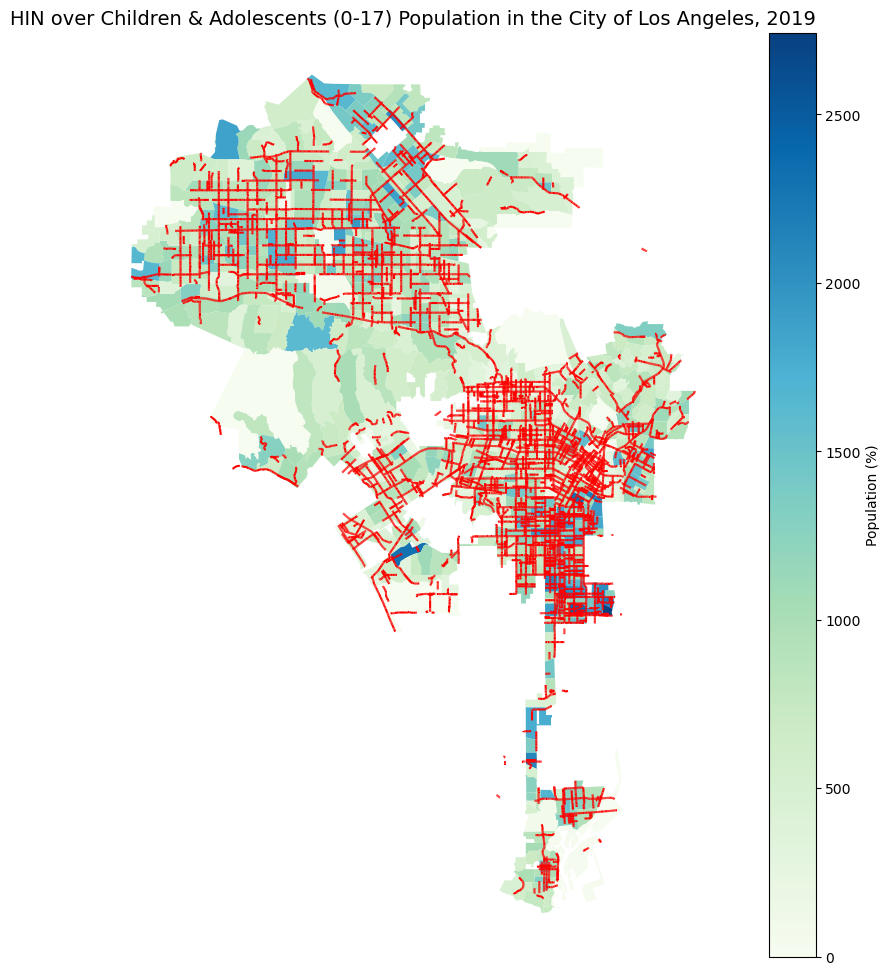

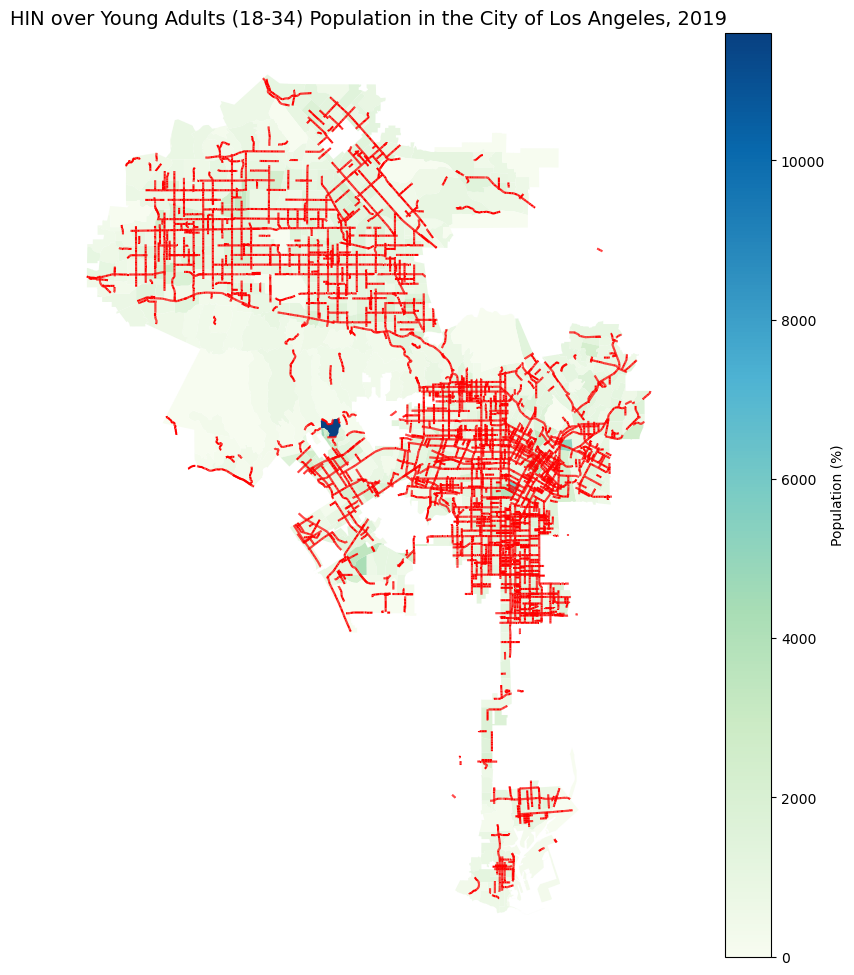

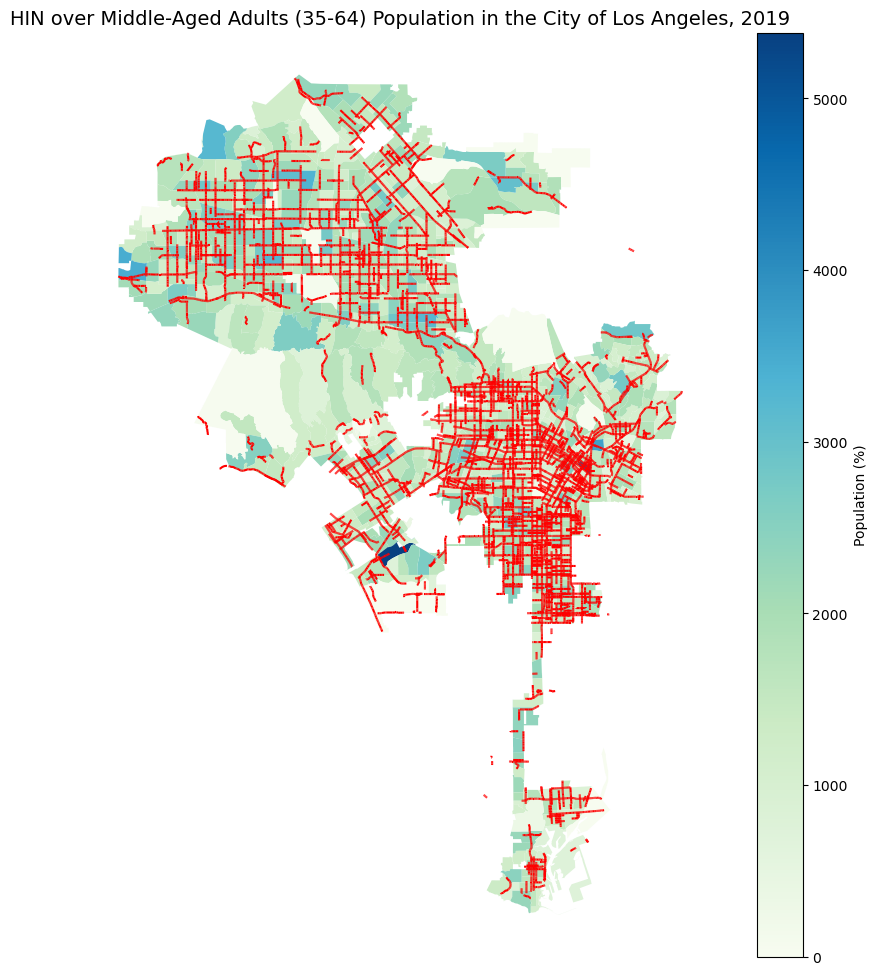

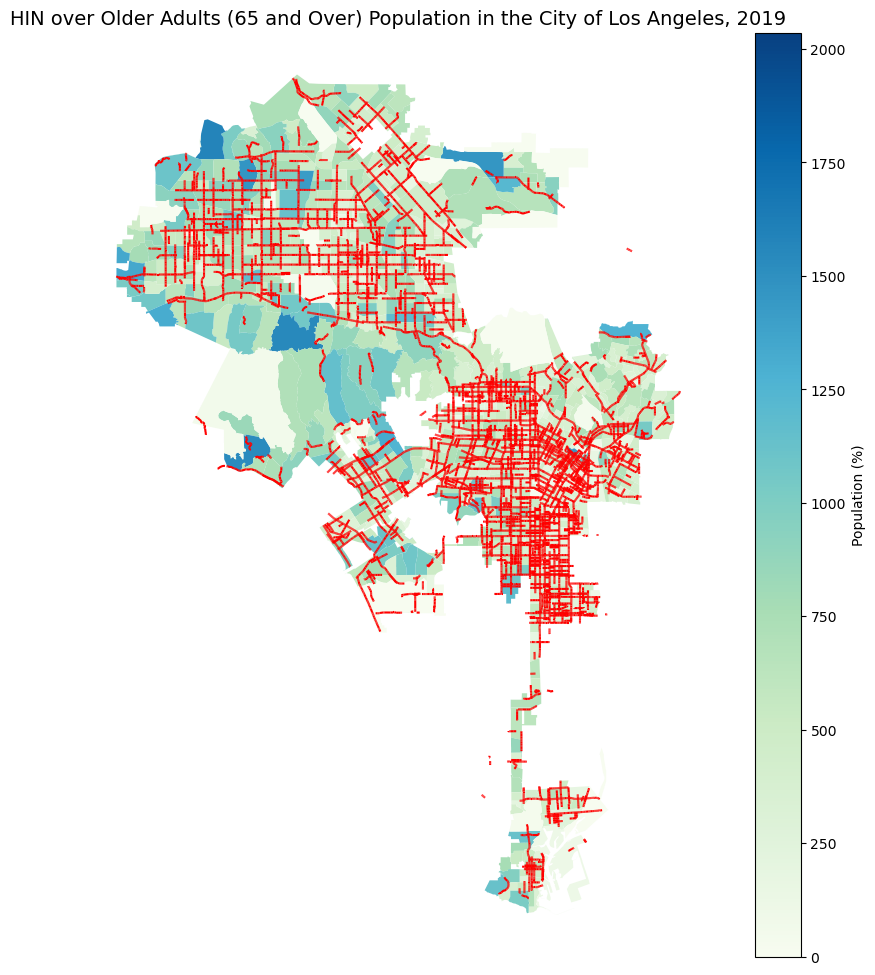

In [29]:
# Function to generate age distribution maps with HIN overlay
def plot_age_maps_with_HIN(data, columns, title_prefix, hin_data):  

    for column in columns:
        fig, ax = plt.subplots(1, 1, figsize=(12, 12))
        
        # Plot census tracts with the selected age group percentage
        la_age.plot(ax=ax, column=column, legend=True, cmap='GnBu',
                    legend_kwds={"label": "Population (%)", "orientation": "vertical"})
        
        # Overlay HIN data
        hin_data.plot(ax=ax, color='red', markersize=.001)
        
        ax.axis('off')
        ax.set_title(f"{title_prefix} {column} Population in the City of Los Angeles, 2019", fontsize=14)

# Loop!
plot_age_maps_with_HIN(la_age, age_map, "HIN over", HINla)
